# US census median household income visualized by tract

## Definition: US Census Tract
A US census tract is a small, relatively permanent geographic subdivision within a county (or similar statistical entity). Here's why they're valuable for analysis compared to counties or states:

- <b>Granularity</b> 🔍: Counties and states are large areas, and data within them can be quite diverse. Census tracts provide a more focused view, allowing you to analyze smaller areas with more homogenous populations or characteristics.
- <b>Targeted Analysis</b> 🎯: This finer detail helps you delve deeper into specific neighborhoods or communities within a larger region.
- <b>Comparisons</b> 🏘️: You can compare data across different census tracts within a county or even across metropolitan areas to identify trends or variations.
- <b>Standardization</b> 🧐: Census tracts are delineated consistently across the US, making them ideal for standardized comparisons between different locations.


Think of it like <b>zooming in on a map</b>. Counties and states are like whole continents, while census tracts are like city districts. By zooming in, you can see the finer details and patterns that might be hidden at a larger scale.

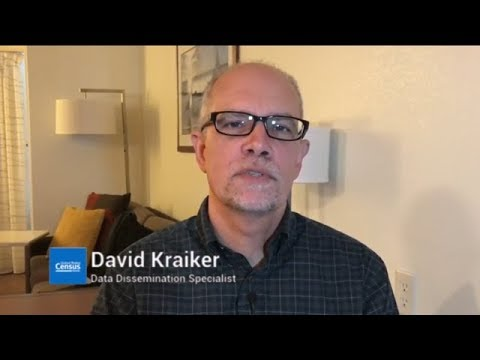

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('DOe4alPmjss') # source: https://www.census.gov/data/academy/data-gems/2018/tract.html

## <font color="blue">Install Packages</font>

## <font color="blue">Imports</font>

In [ ]:
import pandas as pd
import geopandas as gpd
from getpass import getpass
from google.colab import files
import plotly.express as px
import requests
import warnings
pd.set_option('display.max_columns', None) # show all columns
warnings.filterwarnings("ignore") # suppress warnings

## <font color="blue">Locals & Constants</font>

In [ ]:
# census api key - https://api.census.gov/data/key_signup.html
census_api_key = getpass('Enter the api key: ')

Enter the api key: ··········


## <font color="blue">Data</font>

In [ ]:
"""
gemini: https://gemini.google.com/app

I am looking to get census data at the tract level for <median household income> in <monmouth county> <nj>.
Could you please help me get the following:
- the census code for my variable
- the latest acs census year
- the state code for <nj>
- the fips code for <monmouth county>
Thanks!
"""

'\ngemini: https://gemini.google.com/app\n\nI am looking to get census data at the tract level for <median household income> in <monmouth county> <nj>.\nCould you please help me get the following:\n- the census code for my variable\n- the latest acs census year\n- the state code for <nj>\n- the fips code for <monmouth county>\nThanks!\n'

Census ACS Data 5-Year Estimate:
https://www.census.gov/programs-surveys/acs/data/data-via-api.html

In [ ]:
# Census data information
census_code = 'B19013_001E'  # Median household income code
year = '2022'
state_code = '34'  # NJ
county_code = '*'  # All counties in the state

# Build the API request URL
base_url = f'https://api.census.gov/data/{year}/acs/acs5'
fields = f'get=NAME,{census_code}'
geo_filters = f'for=tract:*&in=state:{state_code}&in=county:{county_code}'
url = f'{base_url}?{fields}&{geo_filters}&key={census_api_key}'

# Send request with retry logic and timeout
max_retries = 5
timeout = 10

for attempt in range(1, max_retries + 1):
  try:
    response = requests.get(url, timeout=timeout)
    response.raise_for_status()  # Raise an exception for unsuccessful responses
    break
  except requests.exceptions.RequestException as e:
    print(f"Error: Connection failed. Attempt {attempt} of {max_retries}. Retrying...")
    if attempt == max_retries:
      raise  # Raise the error again if all retries fail

# Process the response data
if response.status_code == 200:
  # Convert JSON data to pandas DataFrame
  data = response.json()
  columns = data[0]  # Extract column names from the first row
  df_census = pd.DataFrame(data[1:], columns=columns)  # Create DataFrame from remaining data

  # Print some info about the DataFrame
  print("Census Data (as DataFrame):")
  print(df_census.head())  # Show the first few rows
  print(f"Data contains {df_census.shape[0]} rows and {df.shape[1]} columns.")

  # You can now use pandas methods to further process and analyze the data...

else:
  print(f"Error: API request failed. Status code: {response.status_code}")


Census Data (as DataFrame):
                                          NAME B19013_001E state county  \
0  Census Tract 1; Atlantic County; New Jersey       44091    34    001   
1  Census Tract 2; Atlantic County; New Jersey       50020    34    001   
2  Census Tract 3; Atlantic County; New Jersey       50663    34    001   
3  Census Tract 4; Atlantic County; New Jersey       33966    34    001   
4  Census Tract 5; Atlantic County; New Jersey       48750    34    001   

    tract  
0  000100  
1  000200  
2  000300  
3  000400  
4  000500  
Data contains 2181 rows and 5 columns.


Census Tract Boundaries

In [ ]:
# read in tract data
df_tract = gpd.read_file(f"https://www2.census.gov/geo/tiger/TIGER{year}/TRACT/tl_{year}_{state_code}_tract.zip")
print("Num of rows:", len(df_tract))
print("Num of columns:", len(df_tract.columns))
df_tract.head(3)

Num of rows: 2181
Num of columns: 13


,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,34,031,256804,34031256804,2568.04,Census Tract 2568.04,G5020,S,29792622,809082,+41.0787934,-074.3779531,"POLYGON ((-74.41591 41.08861, -74.41484 41.089..."
1,34,031,246300,34031246300,2463,Census Tract 2463,G5020,S,10100078,478623,+40.9104210,-074.2642143,"POLYGON ((-74.28932 40.92851, -74.28932 40.928..."
2,34,031,181200,34031181200,1812,Census Tract 1812,G5020,S,401623,0,+40.9242986,-074.1499553,"POLYGON ((-74.15537 40.92394, -74.15535 40.924..."


## <font color="blue">Transformations</font>

In [ ]:
# reset the index
df_census.index = range(1, len(df_tract) + 1)
df_census.head(3)

,NAME,B19013_001E,state,county,tract
1,Census Tract 1; Atlantic County; New Jersey,44091,34,001,000100
2,Census Tract 2; Atlantic County; New Jersey,50020,34,001,000200
3,Census Tract 3; Atlantic County; New Jersey,50663,34,001,000300


In [ ]:
# reset the index
df_tract.index = range(1, len(df_tract) + 1)
df_tract.head(3)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
1,34,031,256804,34031256804,2568.04,Census Tract 2568.04,G5020,S,29792622,809082,+41.0787934,-074.3779531,"POLYGON ((-74.41591 41.08861, -74.41484 41.089..."
2,34,031,246300,34031246300,2463,Census Tract 2463,G5020,S,10100078,478623,+40.9104210,-074.2642143,"POLYGON ((-74.28932 40.92851, -74.28932 40.928..."
3,34,031,181200,34031181200,1812,Census Tract 1812,G5020,S,401623,0,+40.9242986,-074.1499553,"POLYGON ((-74.15537 40.92394, -74.15535 40.924..."


## <font color="blue">Features</font>

In [ ]:
df_census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2181 entries, 1 to 2181
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   NAME         2181 non-null   object
 1   B19013_001E  2181 non-null   object
 2   state        2181 non-null   object
 3   county       2181 non-null   object
 4   tract        2181 non-null   object
dtypes: object(5)
memory usage: 85.3+ KB


In [ ]:
df_tract.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2181 entries, 1 to 2181
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   2181 non-null   object  
 1   COUNTYFP  2181 non-null   object  
 2   TRACTCE   2181 non-null   object  
 3   GEOID     2181 non-null   object  
 4   NAME      2181 non-null   object  
 5   NAMELSAD  2181 non-null   object  
 6   MTFCC     2181 non-null   object  
 7   FUNCSTAT  2181 non-null   object  
 8   ALAND     2181 non-null   int64   
 9   AWATER    2181 non-null   int64   
 10  INTPTLAT  2181 non-null   object  
 11  INTPTLON  2181 non-null   object  
 12  geometry  2181 non-null   geometry
dtypes: geometry(1), int64(2), object(10)
memory usage: 221.6+ KB


In [ ]:
# get unique id by tract
df_census['GEOID'] = df_census['state'] + df_census['county'] + df_census['tract']
df_census[census_code] = df_census[census_code].astype(int)
df_census.head(3)

,NAME,B19013_001E,state,county,tract,GEOID
1,Census Tract 1; Atlantic County; New Jersey,44091,34,001,000100,34001000100
2,Census Tract 2; Atlantic County; New Jersey,50020,34,001,000200,34001000200
3,Census Tract 3; Atlantic County; New Jersey,50663,34,001,000300,34001000300


In [ ]:
# view distribution
df_census[census_code].describe().apply("{0:.5f}".format)

count          2181.00000
mean       -9677521.57084
std        80188970.78343
min      -666666666.00000
25%           69318.00000
50%           96284.00000
75%          130571.00000
max          250001.00000
Name: B19013_001E, dtype: object

In [ ]:
fig = px.histogram(df_census, x=census_code)
fig.show()

## <font color="blue">Filter</font>

In [ ]:
df_census_filter = df_census.loc[df_census[census_code] > 0]
print('Num of tracts:', len(df_census_filter))
df_census_filter.head(3)

Num of tracts: 2149


,NAME,B19013_001E,state,county,tract,GEOID
1,Census Tract 1; Atlantic County; New Jersey,44091,34,001,000100,34001000100
2,Census Tract 2; Atlantic County; New Jersey,50020,34,001,000200,34001000200
3,Census Tract 3; Atlantic County; New Jersey,50663,34,001,000300,34001000300


## <font color="blue">Join</font>

In [ ]:
# merge dfs
df_map = pd.merge(df_census_filter.drop(columns='NAME'), df_tract, on=['GEOID'], how='inner')
# set geo df
df_geo = gpd.GeoDataFrame(df_map).set_index("GEOID")
df_geo.head(3)

,B19013_001E,state,county,tract,STATEFP,COUNTYFP,TRACTCE,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
GEOID,,,,,,,,,,,,,,,,
34001000100,44091,34,001,000100,34,001,000100,1,Census Tract 1,G5020,S,1704430,466900,+39.3566961,-074.4631274,"POLYGON ((-74.47673 39.35835, -74.46822 39.360..."
34001000200,50020,34,001,000200,34,001,000200,2,Census Tract 2,G5020,S,523371,670243,+39.3457246,-074.4581720,"POLYGON ((-74.46781 39.34745, -74.46658 39.348..."
34001000300,50663,34,001,000300,34,001,000300,3,Census Tract 3,G5020,S,365553,45436,+39.3537125,-074.4543882,"POLYGON ((-74.46086 39.35189, -74.46079 39.352..."


Single County: Monmouth County, NJ

In [ ]:
df_geo_county = df_geo.loc[df_geo['county'] == '025']
fig = px.choropleth_mapbox(df_geo_county,
                        geojson=df_geo_county.geometry,
                        locations=df_geo_county.index,
                        color=census_code,
                        color_continuous_scale='Viridis',
                        opacity=0.5,
                        center={"lat": 40.26, "lon": -81.8661},
                        mapbox_style="open-street-map",
                        zoom=8.5,
                        title='Monmouth County, NJ: Median Household Income'
                        )
fig.show()

Full State

In [ ]:
fig = px.choropleth_mapbox(df_geo,
                        geojson=df_geo.geometry,
                        locations=df_geo.index,
                        color=census_code,
                        color_continuous_scale='Viridis',
                        opacity=0.5,
                        center={"lat": 40.26, "lon": -74.20},
                        mapbox_style="open-street-map",
                        zoom=6
                        )
fig.show()

## <font color="blue">Output</font>

In [ ]:
# [OPTIONAL] export into a csv file
file_name = 'output.csv'
df_census.to_csv(file_name, index=False)
files.download(file_name)

# End Notebook